In [1]:
import skimage
import cv2
import numpy as np

from PIL import Image, ImageFilter
from sklearn.feature_extraction import image

import matplotlib.pyplot as plt

In [2]:
img_bird = Image.open('data/unsplash.jpg')

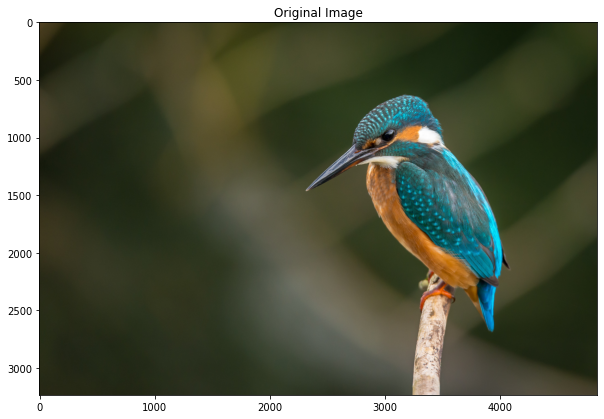

In [3]:
plt.figure(figsize=(10, 10))
plt.imshow(img_bird)
plt.title('Original Image')
plt.show();

In [4]:
print(f'Image size: {img_bird.size}')
print(f'Image mode: {img_bird.mode}')
print(f'Image format: {img_bird.format}')

Image size: (4844, 3234)
Image mode: RGB
Image format: JPEG


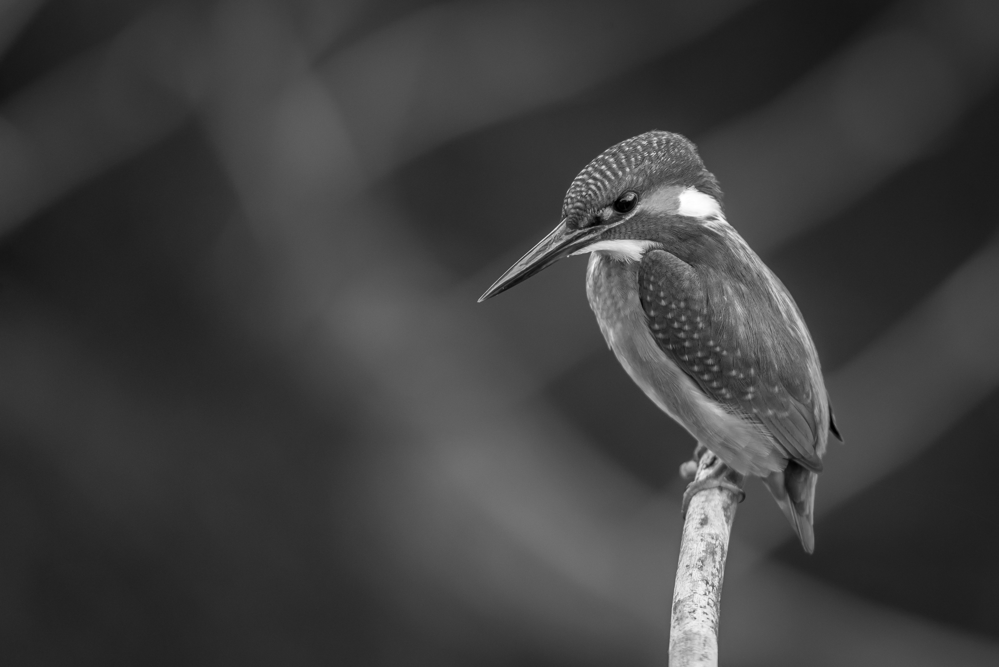

In [5]:
gs = img_bird.convert('L') # Convert to grayscale
gs

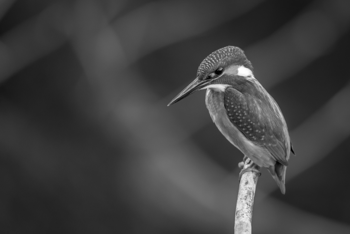

In [6]:
gs.thumbnail((350, 350))
gs

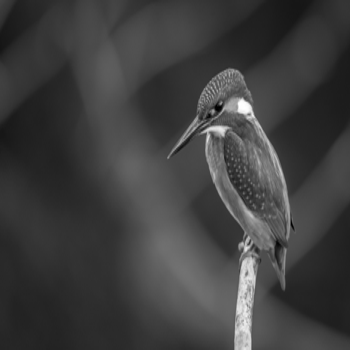

In [7]:
img_resized = gs.resize((350, 350))
img_resized

In [11]:
img_bird.thumbnail((350, 350))
hoz_flip = img_bird.transpose(Image.FLIP_LEFT_RIGHT)
ver_flip = img_bird.transpose(Image.FLIP_TOP_BOTTOM)

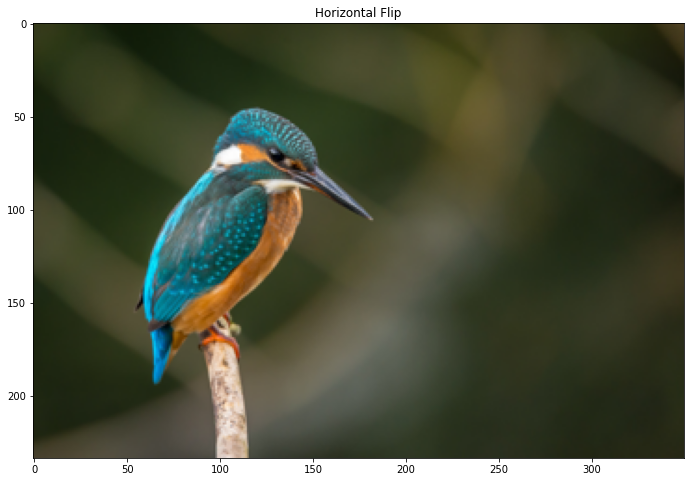

In [14]:
plt.figure(figsize=(12, 8))
plt.title('Horizontal Flip')
plt.imshow(hoz_flip)
plt.show();

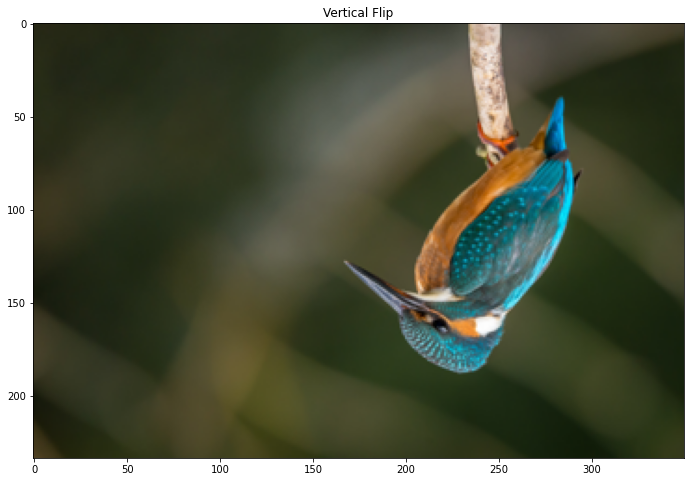

In [15]:
plt.figure(figsize=(12, 8))
plt.title('Vertical Flip')
plt.imshow(ver_flip)
plt.show();

In [16]:
img_arr = np.array(img_bird)
type(img_arr)

numpy.ndarray

In [17]:
img_arr.shape

(234, 350, 3)

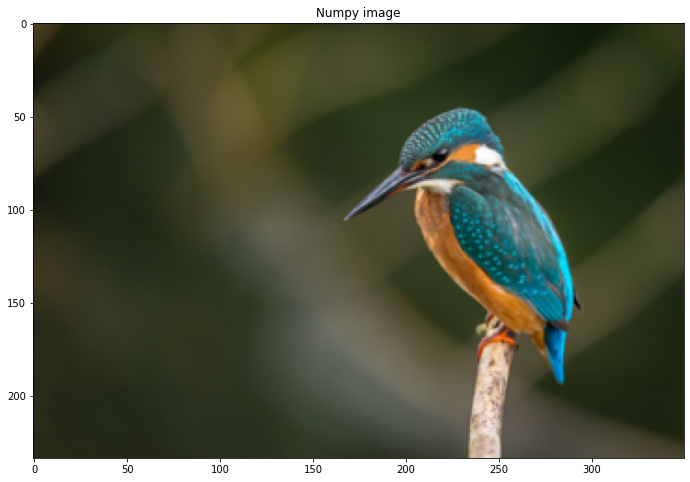

In [18]:
plt.figure(figsize=(12, 8))
plt.title('Numpy image')
plt.imshow(img_arr, cmap='gray')

Image shape: (234, 350)


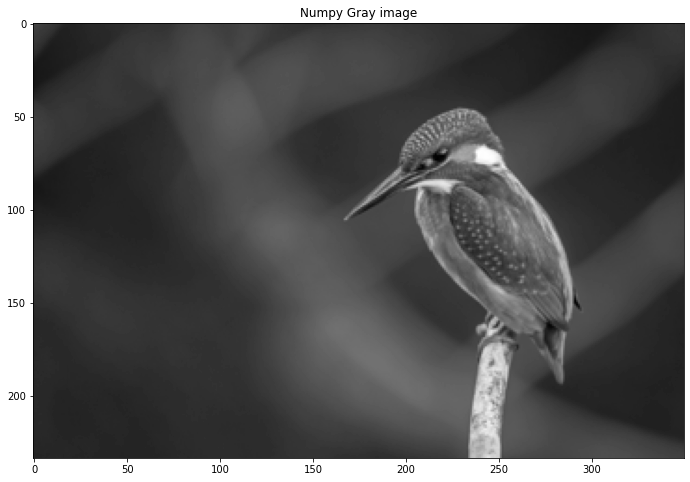

In [19]:
from skimage.color import rgb2gray
img_arr_gray = rgb2gray(img_arr)

print(f'Image shape: {img_arr_gray.shape}')
plt.figure(figsize=(12, 8))
plt.title('Numpy Gray image')
plt.imshow(img_arr_gray, cmap='gray');

Image shape: (224, 224, 3)


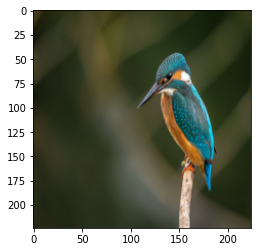

In [21]:
from skimage.transform import resize
img_resized = resize(img_arr, (224, 224), anti_aliasing=True)
print(f'Image shape: {img_resized.shape}')
plt.imshow(img_resized, cmap='gray');


In [22]:
patches = image.extract_patches_2d(img_arr, (64, 64))
patches.shape

(49077, 64, 64, 3)

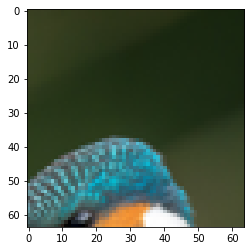

In [31]:
plt.imshow(patches[2500], cmap='gray');

In [32]:
from skimage import data, io, filters

C:\Users\Safiuddin\anaconda3\lib\importlib\_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


In [33]:
image = data.coins()
print(image)

[[ 47 123 133 ...  14   3  12]
 [ 93 144 145 ...  12   7   7]
 [126 147 143 ...   2  13   3]
 ...
 [ 81  79  74 ...   6   4   7]
 [ 88  82  74 ...   5   7   8]
 [ 91  79  68 ...   4  10   7]]


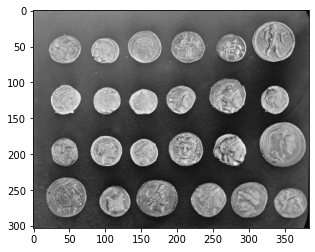

In [34]:
plt.imshow(image, cmap='gray');

In [35]:
image.shape

(303, 384)

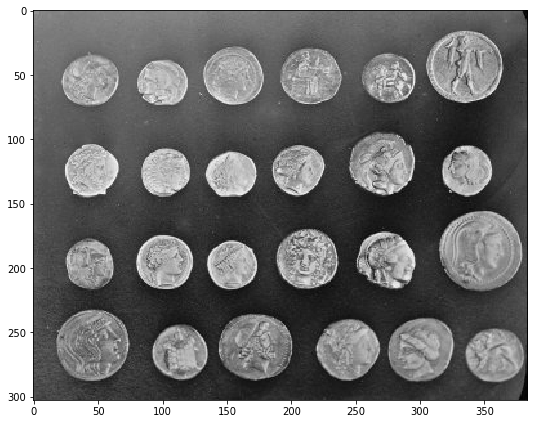

In [36]:
plt.figure(figsize=(12, 6))
io.imshow(image)
plt.show();

In [37]:
edges = filters.sobel(image)
print(edges)

[[0.22261811 0.22580966 0.04256528 ... 0.01675295 0.00765711 0.0202113 ]
 [0.22752914 0.17208326 0.04307036 ... 0.03683979 0.00765711 0.01180548]
 [0.10007686 0.06139791 0.02499519 ... 0.084638   0.00490196 0.02018751]
 ...
 [0.01386484 0.03114192 0.02949335 ... 0.01669548 0.00588235 0.00876889]
 [0.02752092 0.04030354 0.0335059  ... 0.00571662 0.00980392 0.00438445]
 [0.02941176 0.05787636 0.0417099  ... 0.00490196 0.00876889 0.00554594]]


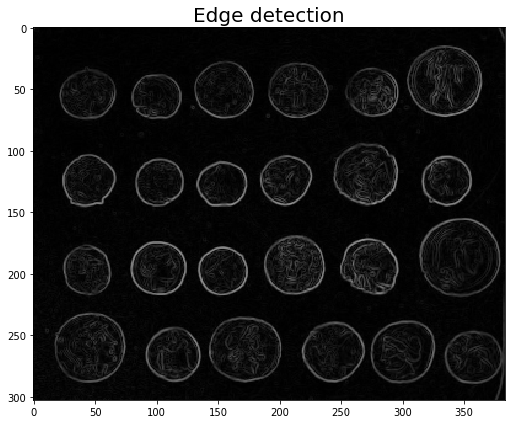

In [38]:
plt.figure(figsize=(12, 6))
plt.title('Edge detection', fontsize=20)
io.imshow(edges)
plt.show();

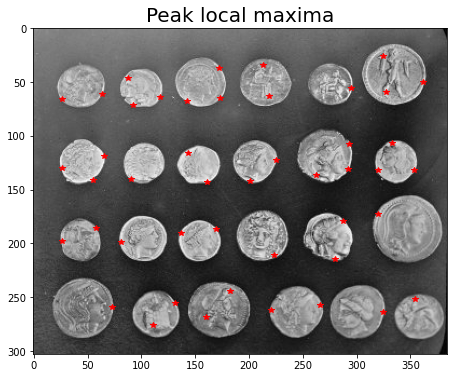

In [41]:
from skimage.feature import peak_local_max

coordinates = peak_local_max(image, min_distance=20)

fig, axes = plt.subplots(figsize=(12, 6))
axes.imshow(image, cmap=plt.cm.gray)

axes.plot(coordinates[:, 1], coordinates[:, 0], 'r*')
axes.set_title('Peak local maxima', fontsize=20)
plt.show();

In [42]:
bird = cv2.imread('data/unsplash.jpg')
bird.shape

(3234, 4844, 3)

In [43]:
gray1 = cv2.cvtColor(bird, cv2.COLOR_BGR2GRAY)
gray1.shape

(3234, 4844)

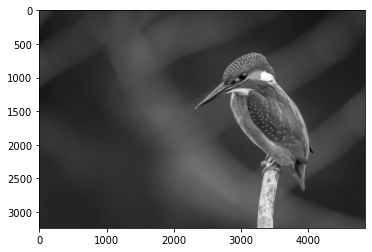

In [44]:
plt.imshow(gray1, cmap='gray');

In [49]:
# SIFT - Scale-Invariant Feature Transform
# To detect keypoints, we use the SIFT feature detector.
sift = cv2.xfeatures2d.SIFT_create()
keypoints1, descriptors1 = sift.detectAndCompute(img_arr, None)
keypoints1

(<KeyPoint 0000021C390C75A0>,
 <KeyPoint 0000021C3953B1E0>,
 <KeyPoint 0000021C39C9AC60>,
 <KeyPoint 0000021C3914A420>,
 <KeyPoint 0000021C3C1CB4E0>,
 <KeyPoint 0000021C3C1CB360>,
 <KeyPoint 0000021C3C1CB390>,
 <KeyPoint 0000021C3C1CB480>,
 <KeyPoint 0000021C0005EED0>,
 <KeyPoint 0000021C0005ECF0>,
 <KeyPoint 0000021C0005ED50>,
 <KeyPoint 0000021C0005EEA0>,
 <KeyPoint 0000021C0005EC60>,
 <KeyPoint 0000021C0005EB10>,
 <KeyPoint 0000021C0005ECC0>,
 <KeyPoint 0000021C0005EDB0>,
 <KeyPoint 0000021C3B2A8AE0>,
 <KeyPoint 0000021C3B2A8E10>,
 <KeyPoint 0000021C3B2A8CC0>,
 <KeyPoint 0000021C3B2A82A0>,
 <KeyPoint 0000021C3B2A8390>,
 <KeyPoint 0000021C3B2A8600>,
 <KeyPoint 0000021C3B2A89C0>,
 <KeyPoint 0000021C3B2A8540>,
 <KeyPoint 0000021C3B2A8B70>,
 <KeyPoint 0000021C3B2A8330>,
 <KeyPoint 0000021C3B2A8F60>,
 <KeyPoint 0000021C3B2A8CF0>,
 <KeyPoint 0000021C00140030>,
 <KeyPoint 0000021C00140060>,
 <KeyPoint 0000021C00140090>,
 <KeyPoint 0000021C001400C0>,
 <KeyPoint 0000021C001400F0>,
 <KeyPoint

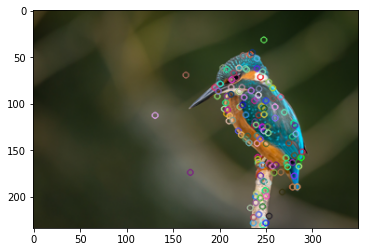

In [50]:
img1 = cv2.drawKeypoints(img_arr, keypoints1, None)
plt.imshow(img1, cmap='gray');

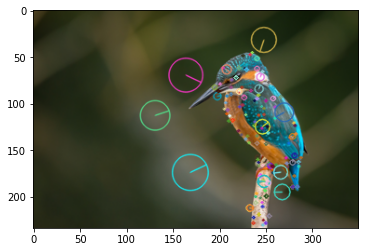

In [52]:
img2 = cv2.drawKeypoints(img_arr, keypoints1, outImage=None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
plt.imshow(img2, cmap='gray');
# Every keypoint is represented by a circle with size and orientation parameters.

In [53]:
descriptors1.shape

(139, 128)

In [54]:
hor_flip_arr = np.array(hoz_flip)
kp2, des2 = sift.detectAndCompute(hor_flip_arr, None)

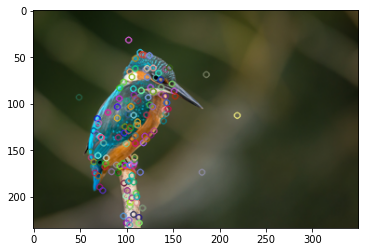

In [55]:
plt.imshow(cv2.drawKeypoints(hor_flip_arr, kp2, None), cmap='gray');

In [56]:
bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
matches = bf.match(descriptors1, des2)

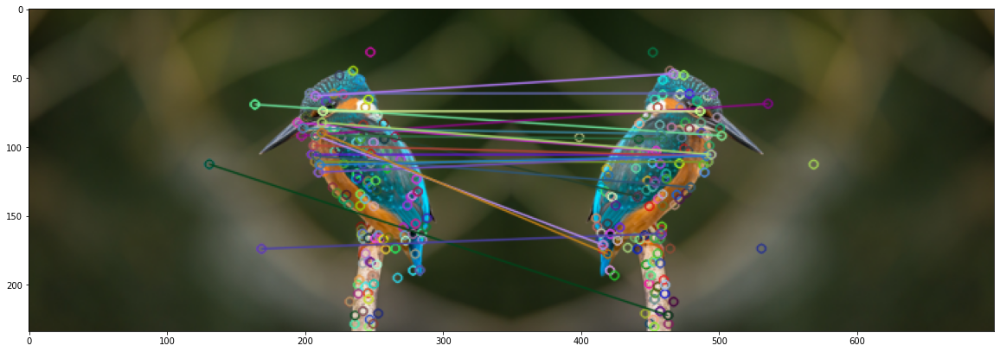

In [57]:
N_MATCHES = 20

match_img = cv2.drawMatches(img_arr, keypoints1, hor_flip_arr, kp2, matches[:N_MATCHES], hor_flip_arr.copy(), flags=0)

plt.figure(figsize=(20, 10))
plt.imshow(match_img, cmap='gray');